In [1]:
# import pandas as pd
from csv import reader
from tqdm.notebook import tqdm
from collections import Counter
import matplotlib.pyplot as plt
import statistics
import numpy as np
import pandas as pd
import statistics

## read dataset

In [8]:
recipes = []
cuisines = []

with open('../train.csv', 'r') as train_csv:
    csv_reader = reader(train_csv)
    for row in tqdm(csv_reader):
        recipes.append(row[:-1])
        cuisines.append(row[-1])
        
# with open('../validation_classification_question.csv', 'r') as val_clf_q_csv:
#     csv_reader = reader(val_clf_q_csv)
#     for row in tqdm(csv_reader):
#         recipes.append(row)

# with open('../validation_classification_answer.csv', 'r') as val_clf_a_csv:
#     csv_reader = reader(val_clf_a_csv)
#     for row in tqdm(csv_reader):
#         cuisines.append(row)

# with open('../validation_completion_question.csv', 'r') as val_cpl_q_csv:
#     csv_reader = reader(val_cpl_q_csv)
#     for row in tqdm(csv_reader):
#         recipes.append(row)

# with open('../validation_completion_answer.csv', 'r') as val_cpl_a_csv:
#     csv_reader = reader(val_cpl_a_csv)
#     for row in tqdm(csv_reader):
#         cuisines.append(row)

print(len(recipes))
print(len(cuisines))
print(recipes[:10])
print(cuisines[:10])

0it [00:00, ?it/s]

23547
23547
[['2813', '3146', '3229', '3885', '4379', '4390', '5250', '5456', '6187'], ['392', '937', '1476', '2172', '2351', '2813', '3350', '3554', '3857', '3978', '5249', '5648'], ['167', '937', '2124', '2945'], ['400', '628', '937', '1396', '1495', '1783', '2312', '2356', '2710', '2945', '3097', '3447', '3616', '4038', '5136', '5162', '5536', '5648', '5986', '6241'], ['248', '937', '1308', '1476', '1597', '2106', '2710', '2900', '3228', '4917', '5648', '5774'], ['145', '163', '203', '628', '937', '1198', '1807', '1955', '2813', '5377', '5459', '6187', '6352'], ['281', '1308', '1476', '2426', '2982', '3128', '4917', '5377', '5774', '6492'], ['170', '937', '962', '1198', '1720', '2518', '3146', '3202', '3238', '3596', '4030', '4361', '5377'], ['1354', '3653', '5882', '6187', '6352', '6429'], ['310', '529', '1947', '2122', '3051', '3622', '5882', '5970', '6352', '6448']]
['greek', 'filipino', 'indian', 'indian', 'jamaican', 'spanish', 'italian', 'mexican', 'italian', 'italian']


## # of recipe per cuisine

[('italian', 4678), ('mexican', 3836), ('southern_us', 2515), ('indian', 1748), ('chinese', 1599), ('french', 1543), ('cajun_creole', 920), ('thai', 903), ('japanese', 840), ('greek', 714), ('spanish', 590), ('moroccan', 496), ('vietnamese', 487), ('british', 485), ('korean', 474), ('filipino', 452), ('irish', 404), ('russian', 300), ('brazilian', 283), ('jamaican', 280)]
mean 1177.35
population stdev 1182.757340919937


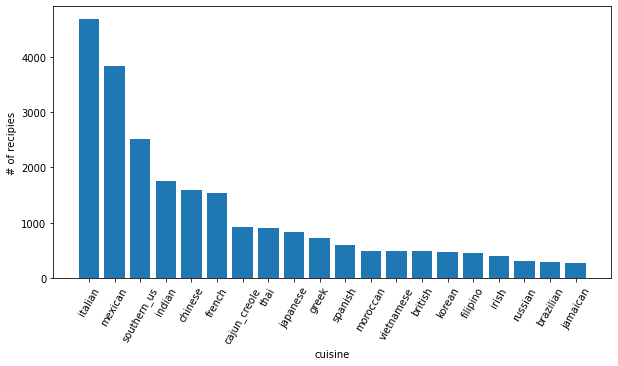

In [5]:
cuisine_counter = Counter(cuisines)
cuisine_list = sorted(list(cuisine_counter.items()), key=lambda x: x[1], reverse=True)
print(cuisine_list)
print('mean', statistics.mean(cuisine_counter.values()))
print('population stdev', statistics.pstdev(cuisine_counter.values()))

plt.figure(figsize=(10,5))
plt.bar([x[0] for x in cuisine_list], [x[1] for x in cuisine_list])
plt.xlabel('cuisine')
plt.ylabel('# of recipies')
plt.xticks(rotation=60)
plt.show()

## recipe length distribution

min 1
max 59
mean 10.763961438824479
median 10
most_frequent [(9, 2208)]
pstdev 4.461069160030935
[(1, 19), (2, 162), (3, 324), (4, 664), (5, 1127), (6, 1564), (7, 1952), (8, 2089), (9, 2208), (10, 2187), (11, 2079), (12, 1829), (13, 1574), (14, 1366), (15, 1088), (16, 840), (17, 696), (18, 522), (19, 359), (20, 289), (21, 194), (22, 131), (23, 74), (24, 55), (25, 45), (26, 30), (27, 13), (28, 17), (29, 14), (30, 11), (31, 5), (32, 4), (33, 3), (34, 2), (35, 2), (36, 2), (37, 0), (38, 1), (39, 0), (40, 2), (41, 0), (42, 0), (43, 1), (44, 0), (45, 0), (46, 0), (47, 0), (48, 0), (49, 1), (50, 0), (51, 0), (52, 1), (53, 0), (54, 0), (55, 0), (56, 0), (57, 0), (58, 0), (59, 1)]


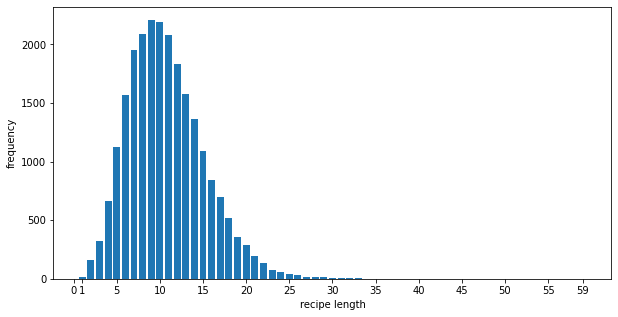

In [6]:
recipe_len_counter = Counter([len(x) for x in recipes])
recipe_len_list = list(recipe_len_counter.items())
min_len = min(recipe_len_counter.keys())
max_len = max(recipe_len_counter.keys())
mean_len = statistics.mean([len(x) for x in recipes])
median_len = statistics.median([len(x) for x in recipes])
pstdev_len = statistics.pstdev([len(x) for x in recipes])
most_freq_len = recipe_len_counter.most_common(1)
print('min', min_len)
print('max', max_len)
print('mean', mean_len)
print('median', median_len)
print('most_frequent', most_freq_len)
print('pstdev', pstdev_len)

for i in range(min_len, max_len+1):
    if i not in recipe_len_counter.keys():
        recipe_len_list.append((i,0))

recipe_len_list = sorted(recipe_len_list, key=lambda x: x[0])
print(recipe_len_list)

plt.figure(figsize=(10,5))
plt.bar([x[0] for x in recipe_len_list], [x[1] for x in recipe_len_list])
plt.xlabel('recipe length')
plt.ylabel('frequency')
plt.xticks(list(range(0, int(max_len//10)*10+10, 5))+[min_len,max_len])
plt.show()

## ingredient frequency

most_common_10 [('937', 10683), ('5377', 4764), ('5536', 4685), ('2945', 4347), ('6187', 4329), ('1308', 3759), ('2122', 3713), ('2518', 2859), ('5648', 2809), ('4799', 2739)]
mean 43.259771292029356
pstdev 245.12965754133268
5859


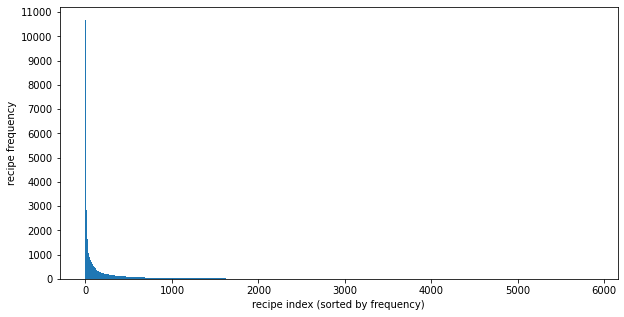

In [12]:
recipe_counter = Counter([ingredient for recipe in recipes for ingredient in recipe])
print('most_common_10', recipe_counter.most_common(10))
print('mean', statistics.mean(recipe_counter.values()))
print('pstdev', statistics.pstdev(recipe_counter.values()))

recipe_list = sorted(list(recipe_counter.items()), key=lambda x: x[1], reverse=True)
print(len(recipe_list))

plt.figure(figsize=(10,5))
plt.bar(range(len(recipe_list)), [x[1] for x in recipe_list], width=10) # , width=0.5 [x[0] for x in recipe_list], 
plt.xlabel('recipe index (sorted by frequency)')
plt.ylabel('recipe frequency')
plt.yticks(range(0, 12000, 1000))
# plt.yscale("log")
plt.show()

In [6]:
recipes_test = np.array([int(ingredient) for recipe in recipes for ingredient in recipe])
print(recipes_test)
print(recipes_test.min())
print(recipes_test.max())

[2813 3146 3229 ... 5379 6023 6386]
0
6713


# recipe embedding visualization

## save onehot embedding as .npy

In [9]:
recipes_onehot = None

for i in tqdm(range(len(recipes))):
    recipe = np.array(recipes[i], dtype=int)
    recipe_onehot = np.zeros(6714)
    recipe_onehot[recipe] = 1
    if recipes_onehot is None:
        recipes_onehot = recipe_onehot
    else:
        recipes_onehot = np.vstack((recipes_onehot, recipe_onehot))

print(recipes[0])
print(recipes_onehot[0])

  0%|          | 0/23547 [00:00<?, ?it/s]

/tmp/ipykernel_5585/931394763.py:4: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  recipe = np.array(recipes[i], dtype=np.int)


['2813', '3146', '3229', '3885', '4379', '4390', '5250', '5456', '6187']
[0. 0. 0. ... 0. 0. 0.]


In [15]:
with open('recipes_onehot.npy', 'wb') as f:
    np.save(f, recipes_onehot)

In [3]:
with open('recipes_onehot.npy', 'rb') as f:
    recipes_onehot = np.load(f)

## tsne

In [1]:
# https://matplotlib.org/stable/gallery/color/named_colors.html
EMOTION_TO_COLOR = {
    'brazilian':"royalblue",
    'british':"green",
    'cajun_creole':"red",
    'chinese':"darkturquoise",
    'filipino':"purple",
    'french':"yellow",
    'greek':"midnightblue",
    'indian':"aqua",
    'irish':"coral",
    'italian':"black",
    'jamaican':"brown",
    'japanese':"darkviolet",
    'korean':"dodgerblue",
    'mexican':"slategray",
    'moroccan':"lightsteelblue",
    'russian':"plum",
    'southern_us':"tan",
    'spanish':"teal",
    'thai':"pink",
    'vietnamese':"salmon"
}

In [5]:
def _get_xy(df, label, c):
    items = df[df['label'] == label]
    print(label, len(items))
    x = df.loc[items.index]['x'].to_numpy()
    y = df.loc[items.index]['y'].to_numpy()
    plt.scatter(x, y, marker="o", color=c, alpha=0.5, s=30, linewidths=1, label=label)

def speech_viz(df):
    plt.figure(figsize=(16,16), dpi=150)
    start_alpha = 0.2
    for idx, label in enumerate(list(set(df['label']))):
        _get_xy(df, label, EMOTION_TO_COLOR[label])
    plt.legend(scatterpoints=1)
    plt.xlabel("$x$")
    plt.ylabel("$y$")
    plt.tight_layout()
    plt.show()

In [14]:
from sklearn.manifold import TSNE

tsne_model = TSNE(n_components=2,
                  perplexity=40, 
                  learning_rate=max(len(recipes_onehot)/12./4, 50), #'auto', 
                  n_iter=1000,
                  metric='cosine', # jaccard
                  init='random',
                  verbose=1).fit_transform(recipes_onehot)

print(tsne_model.shape)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 23547 samples in 0.128s...
[t-SNE] Computed neighbors for 23547 samples in 250.588s...
[t-SNE] Computed conditional probabilities for sample 1000 / 23547
[t-SNE] Computed conditional probabilities for sample 2000 / 23547
[t-SNE] Computed conditional probabilities for sample 3000 / 23547
[t-SNE] Computed conditional probabilities for sample 4000 / 23547
[t-SNE] Computed conditional probabilities for sample 5000 / 23547
[t-SNE] Computed conditional probabilities for sample 6000 / 23547
[t-SNE] Computed conditional probabilities for sample 7000 / 23547
[t-SNE] Computed conditional probabilities for sample 8000 / 23547
[t-SNE] Computed conditional probabilities for sample 9000 / 23547
[t-SNE] Computed conditional probabilities for sample 10000 / 23547
[t-SNE] Computed conditional probabilities for sample 11000 / 23547
[t-SNE] Computed conditional probabilities for sample 12000 / 23547
[t-SNE] Computed conditional probabilities for 

In [15]:
df_viz = pd.DataFrame(index=range(len(cuisines)))
df_viz['x'] = tsne_model[:,0]
df_viz['y'] = tsne_model[:,1]
df_viz['label'] = cuisines
df_viz

,x,y,label
0,17.897070,4.294399,greek
1,-40.012550,-42.222374,filipino
2,-31.758968,3.907171,indian
3,61.274662,-10.247537,indian
4,-64.309784,-6.245980,jamaican
...,...,...,...
23542,-8.731505,-22.734396,mexican
23543,-65.950813,7.401412,irish
23544,2.619284,-72.529228,italian
23545,-56.082142,-8.477566,irish


japanese 840
indian 1748
thai 903
russian 300
korean 474
spanish 590
mexican 3836
chinese 1599
moroccan 496
italian 4678
jamaican 280
british 485
greek 714
southern_us 2515
cajun_creole 920
filipino 452
french 1543
brazilian 283
irish 404
vietnamese 487


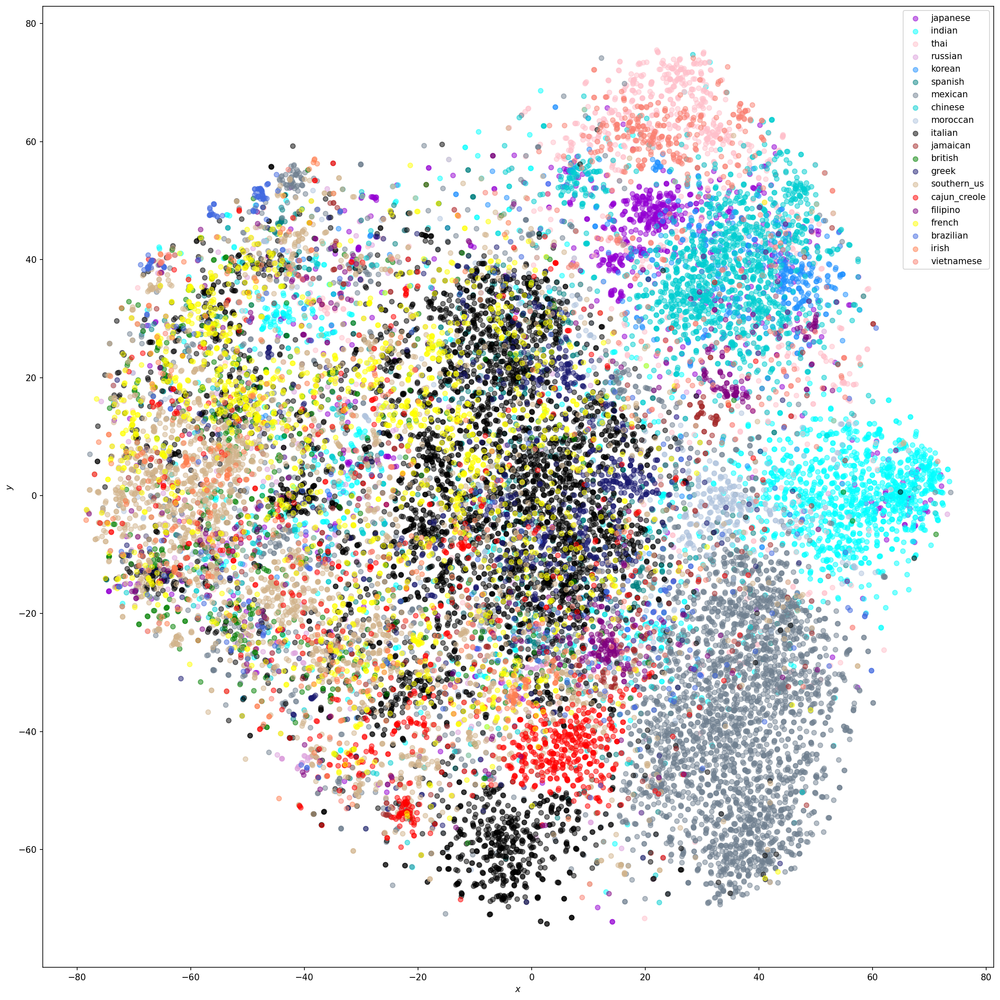

In [16]:
speech_viz(df_viz)

## umap

In [5]:
import umap

m_umap_model = umap.UMAP(n_neighbors=500,
          min_dist=0.5,
          metric='jaccard', # cosine
          verbose=1,
          n_jobs=8).fit_transform(recipes_onehot)

m_umap_model.shape

/home/jnwn/anaconda3/envs/aipj/lib/python3.8/site-packages/umap/umap_.py:1802: UserWarning: gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable
  warn(


UMAP(angular_rp_forest=True, metric='jaccard', min_dist=0.5, n_jobs=8, n_neighbors=500, verbose=1)
Tue Mar 29 22:28:10 2022 Construct fuzzy simplicial set
Tue Mar 29 22:28:11 2022 Finding Nearest Neighbors
Tue Mar 29 22:28:11 2022 Building RP forest with 13 trees
Tue Mar 29 22:28:19 2022 NN descent for 15 iterations
	 1  /  15
	 2  /  15
	 3  /  15
	 4  /  15
	 5  /  15
	 6  /  15
	Stopping threshold met -- exiting after 6 iterations


/home/jnwn/anaconda3/envs/aipj/lib/python3.8/site-packages/pynndescent/pynndescent_.py:906: UserWarning: Failed to correctly find n_neighbors for some samples.Results may be less than ideal. Try re-running withdifferent parameters.
  warn(


Tue Mar 29 23:01:57 2022 Finished Nearest Neighbor Search


/home/jnwn/anaconda3/envs/aipj/lib/python3.8/site-packages/umap/umap_.py:125: UserWarning: A few of your vertices were disconnected from the manifold.  This shouldn't cause problems.
Disconnection_distance = 1 has removed 92992 edges.
It has only fully disconnected 3 vertices.
Use umap.utils.disconnected_vertices() to identify them.
  warn(


Tue Mar 29 23:02:25 2022 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Tue Mar 29 23:03:32 2022 Finished embedding


(23547, 2)

In [8]:
df_viz = pd.DataFrame(index=range(len(cuisines)))
df_viz['x'] = m_umap_model[:,0]
df_viz['y'] = m_umap_model[:,1]
df_viz['label'] = cuisines
df_viz

,x,y,label
0,33.657188,9.421021,greek
1,34.502113,13.248184,filipino
2,34.624973,13.689812,indian
3,31.237654,12.975230,indian
4,37.407990,14.919667,jamaican
...,...,...,...
23542,32.862862,10.544678,mexican
23543,37.117264,13.329658,irish
23544,33.040970,9.528194,italian
23545,36.127888,14.232926,irish


southern_us 2515
british 485
japanese 840
thai 903
italian 4678
brazilian 283
french 1543
vietnamese 487
irish 404
indian 1748
russian 300
jamaican 280
moroccan 496
spanish 590
mexican 3836
filipino 452
chinese 1599
cajun_creole 920
greek 714
korean 474


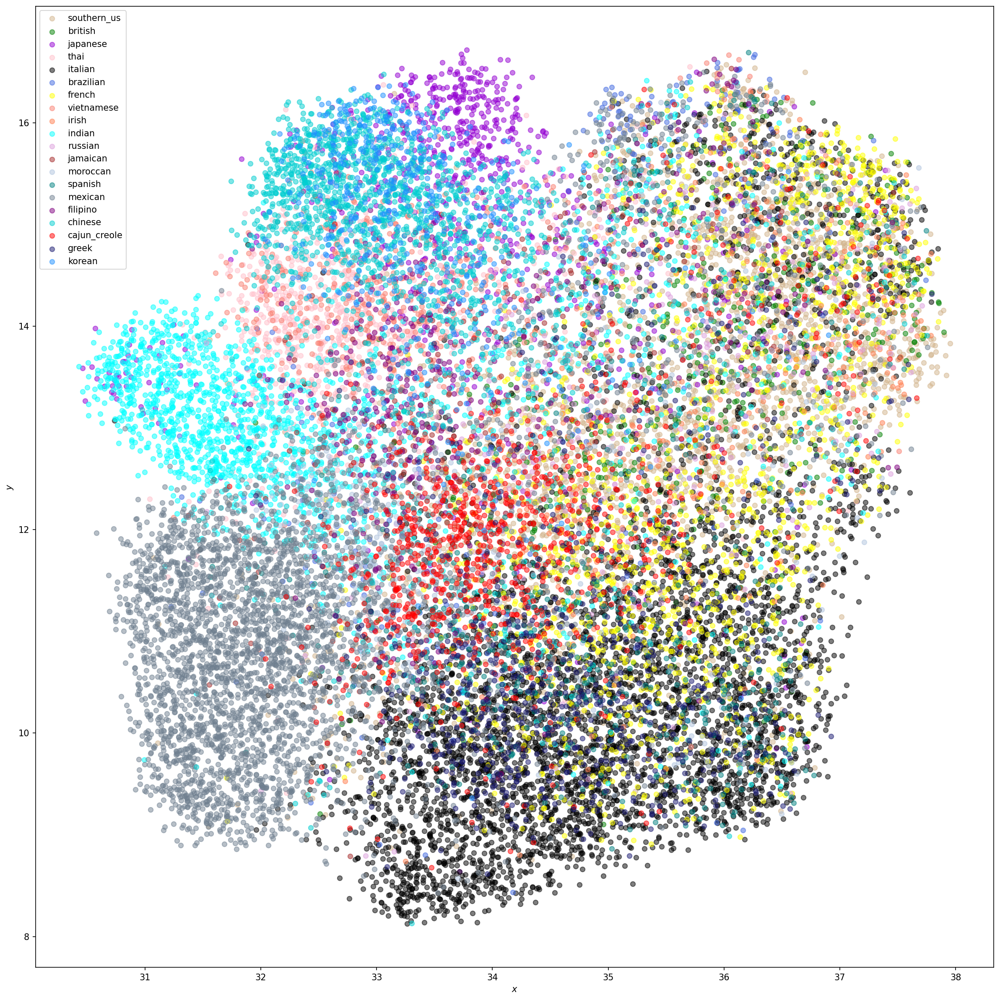

In [9]:
speech_viz(df_viz)